In [3]:
import pandas as pd
import sys, os
import binotools as bt
from binotools import calbino

import numpy as np
import pylab as plt

import astropy.io.fits as fits
from astropy.visualization import simple_norm

# plt.style.use('seaborn-talk')
from matplotlib import rc_file
rc_file(os.environ['WORK_DIR']+'/code/matplotlibrc')

plt.rc('figure', dpi=150, figsize=(5,5))

# Testing binospec sky subtraction + ZAP

# Load a single frame

In [4]:
datadir    = '/Users/cmason/Documents/Research/Observing/CfA/Binospec/individual_frames/'
frame_file = datadir+'obj_clean000_abs_slits_lin_fluxcalib_tellcorr.fits'

bino_plot = bt.BinoPlotter(frame_file)

# Load all the high z slits

In [5]:
# Load slit csv file (output from Binomask)
slits = pd.read_csv(os.environ['BINO_DIR']+'2649_BLAS_1/masks/BLAS_1_slits.csv')
print(slits.shape)

# fits file ext # = slits.index + 1
slits['extnum'] = slits.index + 1
print(len(slits[slits.priority == 3.]))
# slits[slits.priority == 3.]

(174, 14)
44


## Extract all the high z slits to use as sky (priority = 3 and 5) and inspect

- Bad pixels are on original `obj_clean000_abs_slits_lin.fits` frames
    + are they on every frame?
    + how are they being combined?

In [6]:
slit_LBG = slits[(slits.priority == 3.) | (slits.priority == 5.)].reset_index()
len(slit_LBG)

85

In [107]:
def get_highz_slits2D(frame_file, slit_df, edge_pix=3):
    """
    From a fits file and list of slits
    make 2D array with the selected slits
    """

    hdu_data = fits.open(frame_file)

    dat2D_all = None
    for i, slit in slit_df.iterrows():
        dat2D = hdu_data[slit.extnum].data

        # exclude edges
        dat2D_noedge = dat2D[edge_pix:-edge_pix,:]

        if i == 0:
            dat2D_all = dat2D_noedge
        else:
            dat2D_all = np.vstack((dat2D_all, dat2D_noedge))
                        
    return dat2D_all
            
def plot_slits2D(dat2D_all, p_min=5, p_max=95, vmin=None, vmax=None,
                 dpi=150, interpolation='none', cmap='viridis',
                 stretch='linear', set_nan=False,
                 extent=None, aspect=1, wmin=None, wmax=None):
    """Plot 2D array of all slits"""

    if extent is not None:
        if wmin is None:
            wmin = bino_plot.waveA.min()
        if wmax is None:
            wmax = bino_plot.waveA.max()
        extent = [wmin, wmax, 0.5, dat2D_all.shape[0]-0.5]
        xlabel = 'Wavelength [A]'
    else:
        xlabel = 'Wavelength pixel'

    if vmin is None:
        vmin = np.nanpercentile(dat2D_all, p_min)
    if vmax is None:
        vmax = np.nanpercentile(dat2D_all, p_max)
    print(f'vmin: {vmin:.3e},  vmax:{vmax:3e}')
       
    if set_nan:
        mask = ~np.isnan(dat2D_all)
        dat2D_all[mask][np.where((dat2D_all[mask] < vmin) | (dat2D_all[mask] > vmin))] = np.nan
        
    norm = simple_norm(dat2D_all, stretch)

    fig = plt.figure(figsize=(5, 5), dpi=dpi)

    im = plt.imshow(dat2D_all, extent=extent, aspect=aspect,
                    interpolation=interpolation, cmap=cmap,
                    norm=norm, vmin=vmin, vmax=vmax)

    plt.xlabel(xlabel)
    plt.ylabel('Spatial pixel')
    
    plt.colorbar(im, label='Flux', fraction=0.05, pad=0.01, shrink=0.78)
    
    return

## Check for bad pixels on raw, flux calib and telluric corrected frames

Do the calibrations introduce anything weird?

NO ---> Same number of nans for each frame

Plotting tips:

- Linear stretch looks best
- 


 4788279 nans
vmin: -2.108e-01,  vmax:3.066540e-01

 4788279 nans
vmin: -6.550e-19,  vmax:9.528083e-19

 4788279 nans
vmin: -6.948e-19,  vmax:1.019397e-18


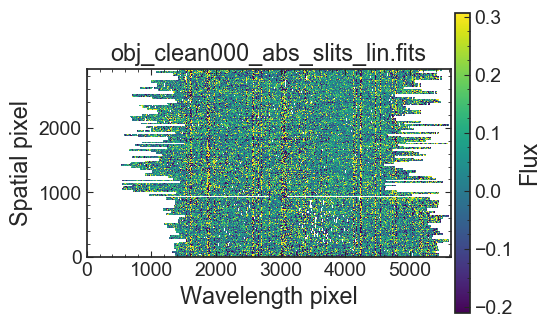

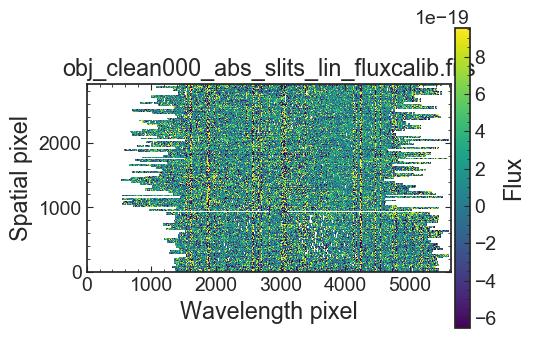

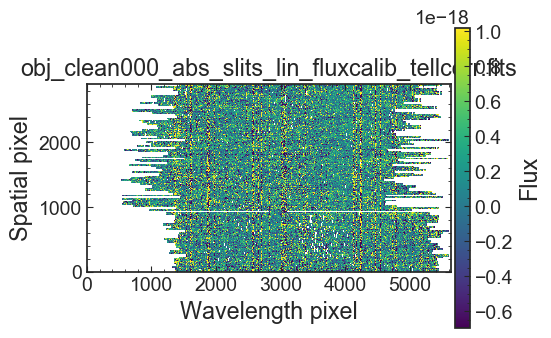

In [8]:
frame_files = [datadir+'obj_clean000_abs_slits_lin.fits', 
               datadir+'obj_clean000_abs_slits_lin_fluxcalib.fits',
               datadir+'obj_clean000_abs_slits_lin_fluxcalib_tellcorr.fits']

p_min, p_max = 5, 95
for frame_file in frame_files:
    dat2D_all = get_highz_slits2D(frame_file, slit_LBG, edge_pix=3)
    print('\n',np.count_nonzero(np.isnan(dat2D_all)),'nans')

    plot_slits2D(dat2D_all, p_min, p_max, dpi=100, aspect=)
    plt.title(frame_file.split('/')[-1])
    
extent = [bino_plot.waveA.min(), bino_plot.waveA.max(),
          0.5, dat2D_all.shape[0]-0.5]

# Median sky

In [9]:
frame_file = datadir+'obj_clean000_abs_slits_lin_fluxcalib_tellcorr.fits'
dat2D_all  = get_highz_slits2D(frame_file, slit_LBG, edge_pix=3)

In [10]:
med_spec1D = np.nanmedian(dat2D_all, axis=0)
std_spec1D = np.nanstd(dat2D_all, axis=0)

/Users/cmason/opt/anaconda3/envs/astroconda/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:995: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)
/Users/cmason/opt/anaconda3/envs/astroconda/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


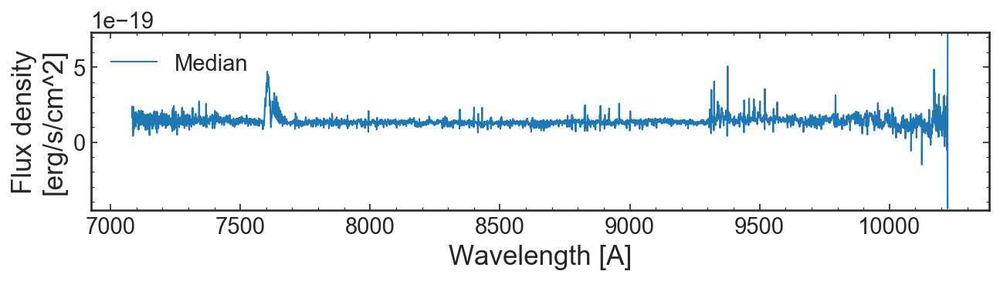

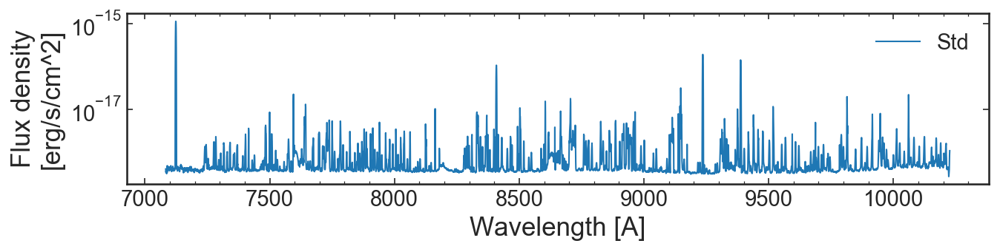

In [11]:
plt.figure(figsize=(10, 2), dpi=150)

plt.plot(bino_plot.waveA, med_spec1D, lw=1, label='Median')

plt.xlabel('Wavelength [A]')
plt.ylabel('Flux density\n[erg/s/cm^2]')

plt.ylim(-5*np.nanstd(med_spec1D), 8*np.nanstd(med_spec1D))
plt.legend()

################

plt.figure(figsize=(10, 2), dpi=150)

plt.semilogy(bino_plot.waveA, std_spec1D, lw=1, label='Std')

plt.xlabel('Wavelength [A]')
plt.ylabel('Flux density\n[erg/s/cm^2]')

# plt.ylim(0, 20*np.nanmedian(std_spec1D))
plt.legend()

## Subtract median sky

Need to rescale at each spatial position

(6, 5632)


(-9.119206462956738e-19, 9.119206462956738e-19)

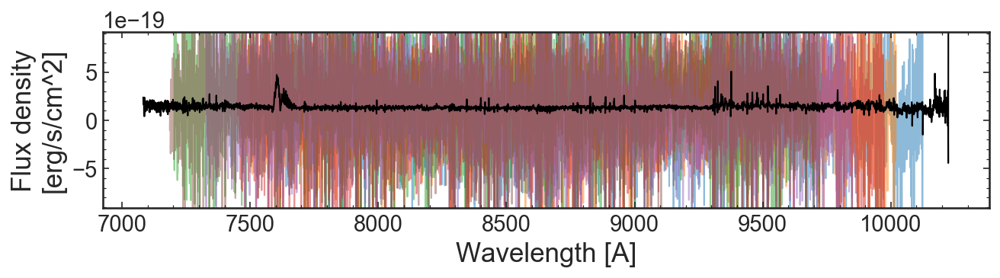

In [12]:
plt.figure(figsize=(10, 2), dpi=150)

print(dat2D_all[::500].shape)
plt.plot(bino_plot.waveA, dat2D_all[::500].T, lw=1, alpha=0.5)
plt.plot(bino_plot.waveA, med_spec1D, lw=1, c='k', label='Median')


plt.xlabel('Wavelength [A]')
plt.ylabel('Flux density\n[erg/s/cm^2]')

plt.ylim(-10*np.nanstd(med_spec1D), 10*np.nanstd(med_spec1D))

vmin: -1.306e-18,  vmax:1.369457e-18


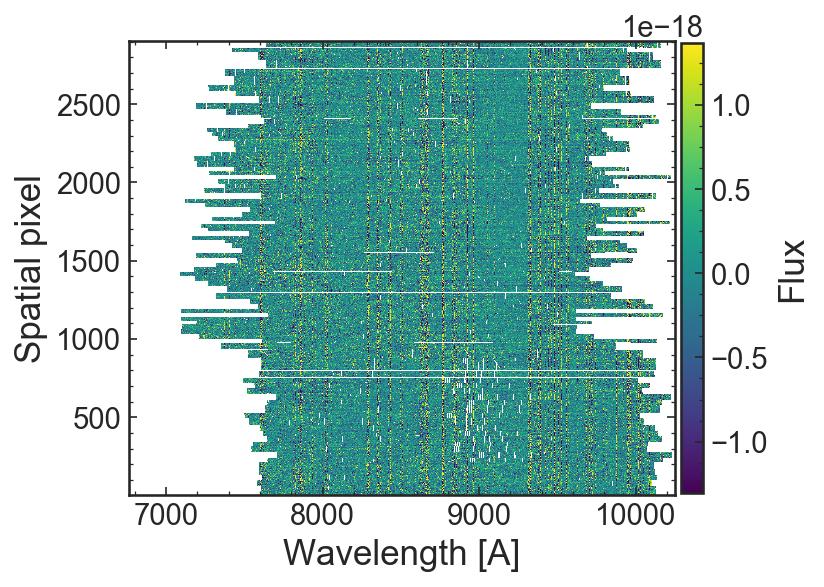

In [74]:
plot_slits2D(dat2D_all-med_spec1D, p_min=2, p_max=98, dpi=150, extent=True)
# plt.title('Data - median sky')

# SVD

In [22]:
def _isvd(data_stack):
    """
    Perform single value decomposition and Calculate PC amplitudes (projection)
    outputs are eigenspectra operates on a 2D array.
    eigenspectra = [nbins, naxes]
    evals = [naxes, nobj]
    data = [nbins, nobj]
    """

    U, s, VT = np.linalg.svd(data_stack)
    eigenspectra = np.transpose(VT)
    evals = data_stack.dot(eigenspectra)
    return [eigenspectra, evals.T]


def clean_dat2D(dat2D, evals, espectra, N_espec=10):
    """
    Successively remove eigenspectra
    """

    components = (evals[:N_espec,None].T * espectra[:,:N_espec]).T
    dat = dat2D.copy()

    i = 0
    var = np.zeros(N_espec)

    while i < N_espec:
        var[i] = np.nanstd(dat)**2.
        dat   -= components[i].T
        i += 1
        
    return dat, var


def plot_espectra(espectra, wave_cut_i, med_spec1D, N_espec=20,
                  scale_sky=1e19, wavemin=None, wavemax=None):
    """
    Plot eigenspectra 2D
    """
    
    print(np.min(espectra), np.max(espectra))

    vmax = 0.05

    fig = plt.figure(constrained_layout=False, figsize=(10,10))
    gs  = fig.add_gridspec(nrows=10, ncols=1, hspace=0.0)
    ax1 = fig.add_subplot(gs[:7])
    ax2 = fig.add_subplot(gs[7:9])
    ax3 = fig.add_subplot(gs[-1])


    extent = [bino_plot.waveA[wave_cut_i].min(), bino_plot.waveA[wave_cut_i].max(),
              0.5, espectra.shape[0]-0.5]

    # All eigenspectra
    ax1.imshow(espectra.T, vmin=-vmax, vmax=vmax, cmap='Greys', 
               interpolation='none', extent=extent, aspect='auto')

    # First few
    ax2.set_prop_cycle('color',[plt.cm.viridis(i) for i in np.linspace(0, 1, N_espec)])
    ax2.plot(bino_plot.waveA[wave_cut_i], espectra[:,:N_espec], lw=1, alpha=8/N_espec)

    # Median data spectrum
    ax3.plot(bino_plot.waveA, scale_sky*med_spec1D, c='k', lw=1, label=r'$\times 10^{-%.0f}$ erg/s/cm$^2$' % np.log10(scale_sky))
    ax2.fill_between(bino_plot.waveA, -1., 1e17*std_spec1D - 1, color='0.7', lw=0, zorder=0)

    ax3.legend(fontsize=10)
    ax1.set_xticks([])
    ax2.set_xticks([])

    ax1.set_ylabel('Eigenvector number')
    ax2.set_ylabel('Eigenvector')
    ax3.set_ylabel('Median flux')
    ax3.set_xlabel('Wavelength [A]')

    if wavemin and wavemax:
        ax2.set_xlim(wavemin, wavemax)        
    else:
        ax2.set_xlim(bino_plot.waveA[wave_cut_i].min(), bino_plot.waveA[wave_cut_i].max())
    ax1.set_xlim(ax2.get_xlim())
    ax3.set_xlim(ax2.get_xlim())

    ax2.set_ylim(-1, 1)
    ax3.set_ylim(0, 1.1*np.nanmax(1e19*med_spec1D[wave_cut_i]))    
    
    return


In [57]:
def get_dat2D_section(dat2D_all, rescale=1e19, wavemin=9200., wavemax=9600., 
                      plot=True, aspect=0.1, p_min=5, p_max=95):
    """
    Grab a wavelength segment of the 2D slit data
    n x m
    """

    dat2D = dat2D_all.copy()
    print('Original dat2D shape', dat2D.shape)

    # Wavelength section
    wave_cut_i = np.where((bino_plot.waveA > wavemin) & (bino_plot.waveA < wavemax))[0]
    dat2D_cut  = dat2D[:,wave_cut_i]
    print('New dat2D shape', dat2D_cut.shape)
    
    vmin = np.nanpercentile(dat2D_cut, p_min)
    vmax = np.nanpercentile(dat2D_cut, p_max)
    dat2D_std = dat2D_cut.copy()
    dat2D_std[np.where((dat2D_cut < vmin) & (dat2D_cut > vmax))] = np.nan
    std_rescale = np.nanstd(dat2D_std, axis=1)
    
    # Rescale for PCA by normalising by std at each spatial pixel
#     dat2D_cut_rescale_nm = dat2D_cut_fillnan*rescale
    dat2D_cut_rescale = dat2D_cut / std_rescale[:, None]
    print('Rescaled dat2D shape',dat2D_cut_rescale.shape)

    # Fill nans with median
    print('Initial number of nan pixels:',len(dat2D_cut_rescale[np.isnan(dat2D_cut_rescale)]))
    med   = np.nanmedian(dat2D_cut_rescale)
    med1D = np.nanmedian(dat2D_cut_rescale, axis=0)
    med1D[np.isnan(med1D)] = med
    med2D = np.tile(med1D, (dat2D_cut_rescale.shape[0],1))    
    dat2D_cut_rescale[np.isnan(dat2D_cut_rescale)] = med2D[np.isnan(dat2D_cut_rescale)]
    print('Final number of nan pixels:',len(dat2D_cut_rescale[np.isnan(dat2D_cut_rescale)]))

    if plot:
        plot_slits2D(dat2D_cut_rescale, p_min=p_min, p_max=p_max, aspect=aspect,
                     extent=True, wmin=wavemin, wmax=wavemax, cmap='viridis')
        
    return dat2D_cut_rescale, wave_cut_i, std_rescale

## Small wavelength chunk

Select small wavelength region

Original dat2D shape (2907, 5632)
New dat2D shape (2907, 484)
Rescaled dat2D shape (2907, 484)
Initial number of nan pixels: 24588


/Users/cmason/opt/anaconda3/envs/astroconda/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in less
/Users/cmason/opt/anaconda3/envs/astroconda/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in greater


Final number of nan pixels: 0
vmin: -2.965e+00,  vmax:3.509865e+00


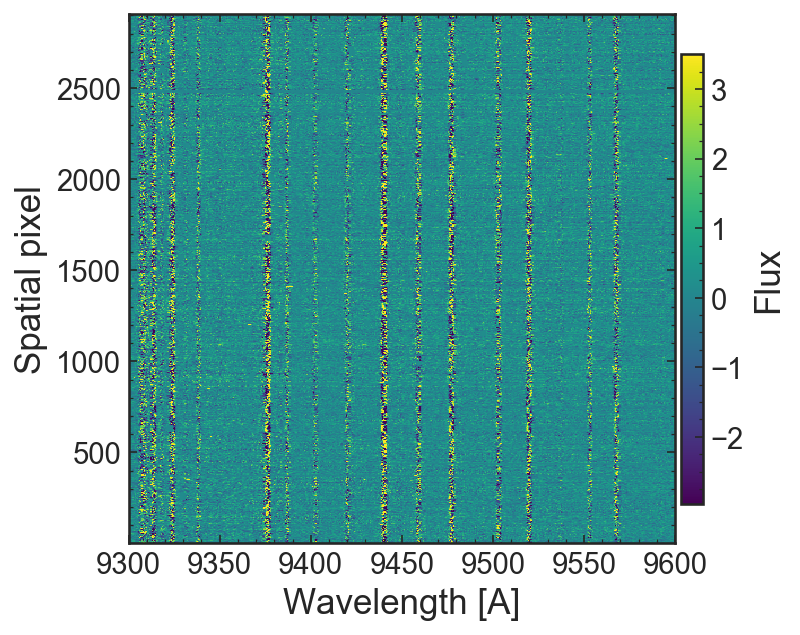

In [58]:
dat2D_cut_rescale_nm, wave_cut_i, std_rescale = get_dat2D_section(dat2D_all, wavemin=9300., wavemax=9600., 
                                                                  aspect=0.1, p_min=1, p_max=99)

### Do SVD

In [59]:
espectra, evals = _isvd(dat2D_cut_rescale_nm)
print(espectra.shape, evals.shape)

(484, 484) (484, 2907)


-0.6202688287915727 0.6157883736170205


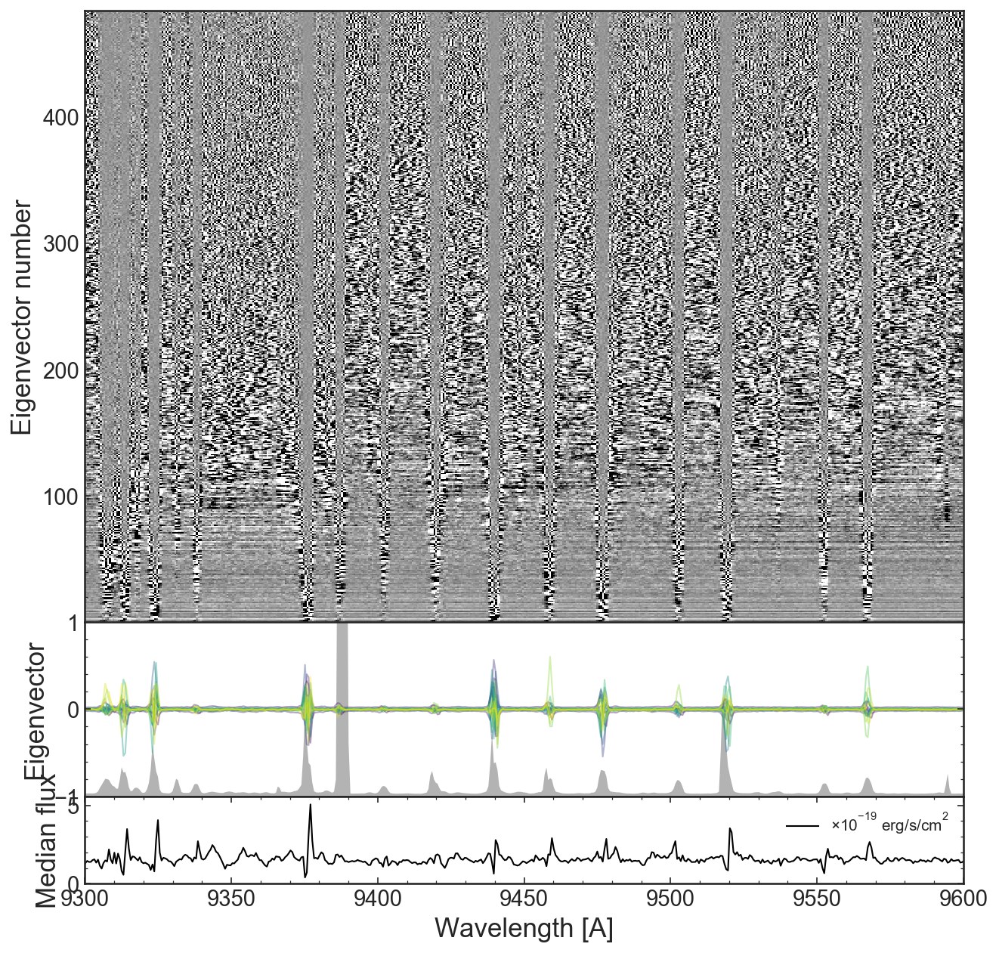

In [60]:
plot_espectra(espectra, wave_cut_i, med_spec1D, wavemin=9300., wavemax=9600.)

### Contribution of eigenspectra to variance

#### Single spectrum

(484, 484)


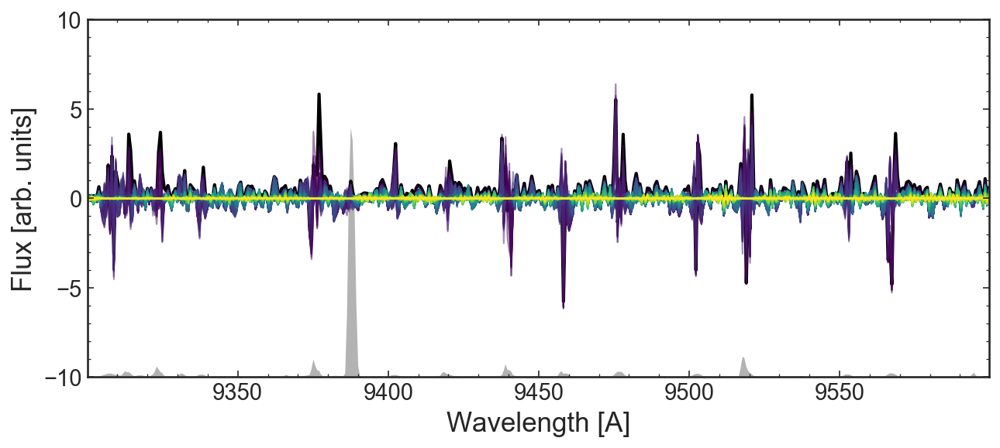

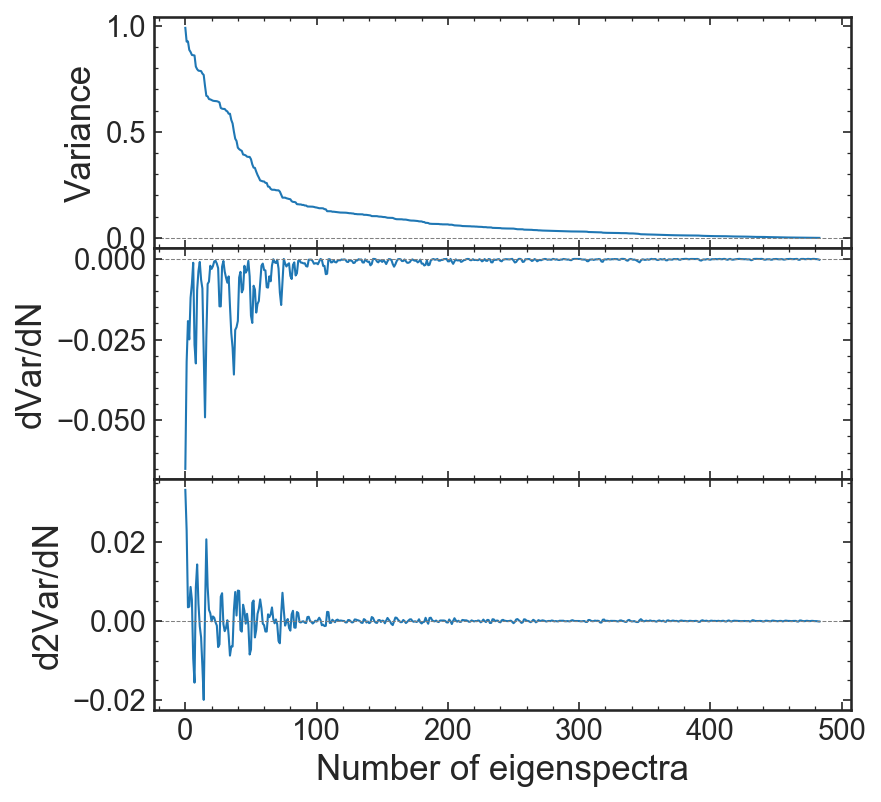

In [24]:
N_espec = 484
fig, ax = plt.subplots(1,1, figsize=(10,4))
ax.set_prop_cycle('color',[plt.cm.viridis(i) for i in np.linspace(0, 1, N_espec)])

# For each spatial pixel strip n
for n, ev in enumerate(evals.T):
    
    if n == 1500:

        components = (ev[:N_espec] * espectra[:,:N_espec]).T
        dat = dat2D_cut_rescale_nm[n].copy()
        print(components.shape)
        ax.plot(bino_plot.waveA[wave_cut_i], dat, lw=2, c='k')

        i = 0
        var = np.zeros(N_espec)
                
        while i < N_espec:
            var[i] = np.nanstd(dat)**2.
            dat   -= components[i]
            i += 1
            
            ax.plot(bino_plot.waveA[wave_cut_i], dat, lw=1, alpha=0.5)
    
        ax.fill_between(bino_plot.waveA, -10., 1e17*std_spec1D - 10, color='0.7', lw=0, zorder=0)
        plt.xlim(bino_plot.waveA[wave_cut_i].min(), bino_plot.waveA[wave_cut_i].max())
        plt.ylim(-10,10)
        plt.ylabel('Flux [arb. units]')
        plt.xlabel('Wavelength [A]')
    
        fig, ax = plt.subplots(3,1, figsize=(6,6), sharex=True)

        ax[0].plot(np.arange(N_espec), var, lw=1)
        ax[1].plot(np.arange(N_espec), np.gradient(var), lw=1)
        ax[2].plot(np.arange(N_espec), np.gradient(np.gradient(var)), lw=1)

        for axi in ax:
            axi.axhline(0., lw=0.5, ls='dashed', c='0.5')
            
        plt.xlabel('Number of eigenspectra')
        ax[0].set_ylabel('Variance')
        ax[1].set_ylabel('dVar/dN')
        ax[2].set_ylabel('d2Var/dN')
        
        fig.subplots_adjust(hspace=0)

#### All spectra

In [61]:
dat2D_clean, var = clean_dat2D(dat2D_cut_rescale_nm, evals, espectra, N_espec=484)

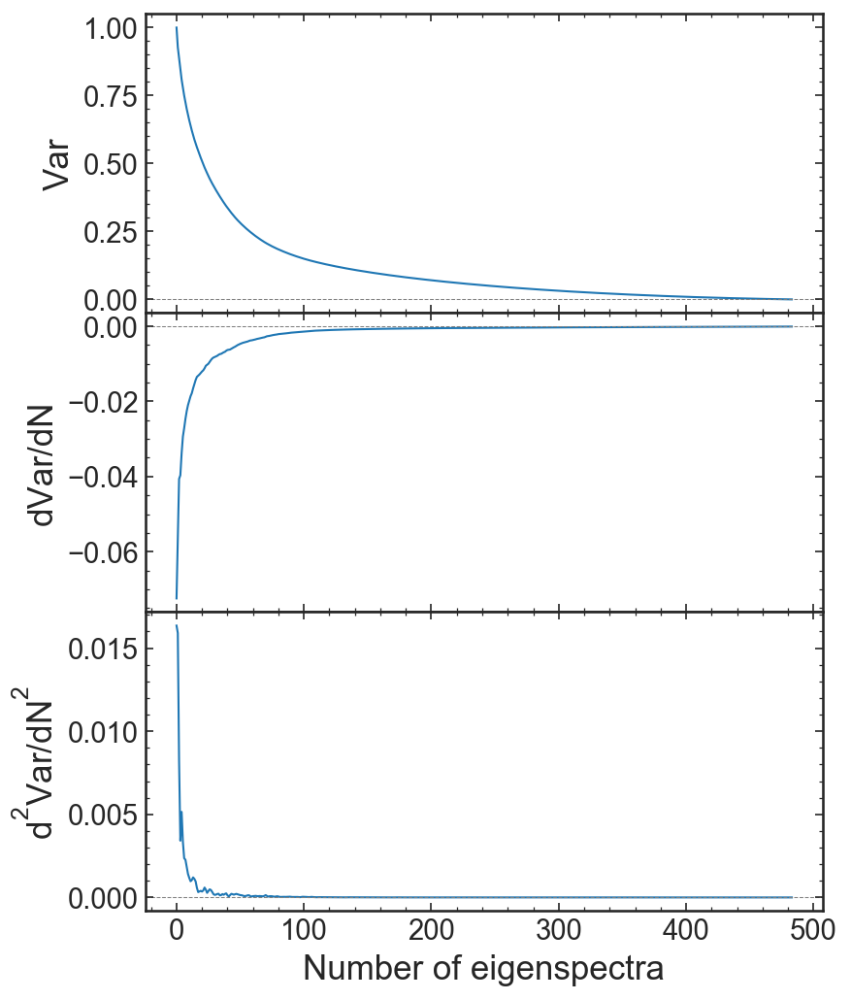

In [62]:
fig, ax = plt.subplots(3,1, figsize=(6,8), sharex=True)

ax[0].plot(np.arange(N_espec), var, lw=1)
ax[1].plot(np.arange(N_espec), np.gradient(var), lw=1)
ax[2].plot(np.arange(N_espec), np.gradient(np.gradient(var)), lw=1)

for axi in ax:
    axi.axhline(0, lw=0.5, ls='dashed', c='0.5')

plt.xlabel('Number of eigenspectra')
ax[0].set_ylabel('Var')
ax[1].set_ylabel('dVar/dN')
ax[2].set_ylabel('d$^2$Var/dN$^2$')

fig.subplots_adjust(hspace=0)

### Compare before and after

vmin: -2.000e-18,  vmax:2.000000e-18
vmin: -2.000e-18,  vmax:2.000000e-18


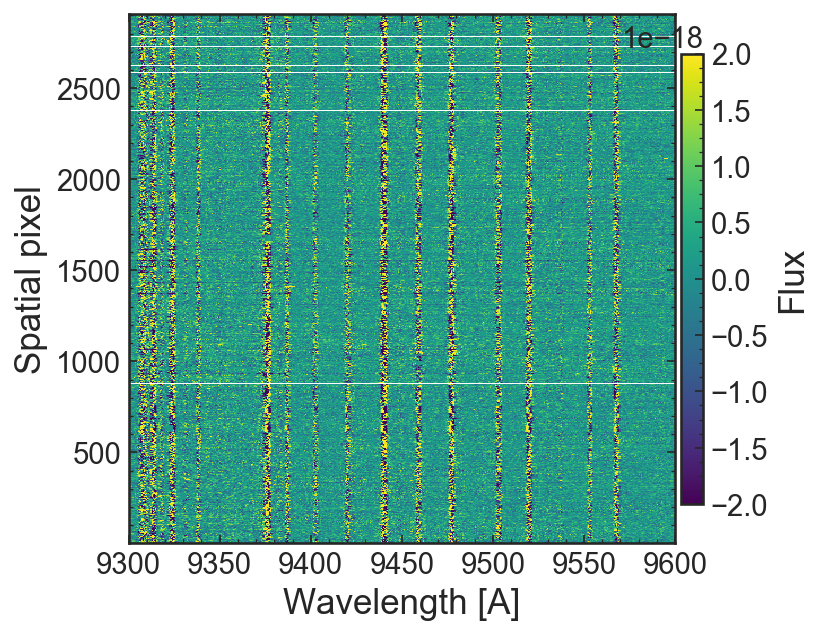

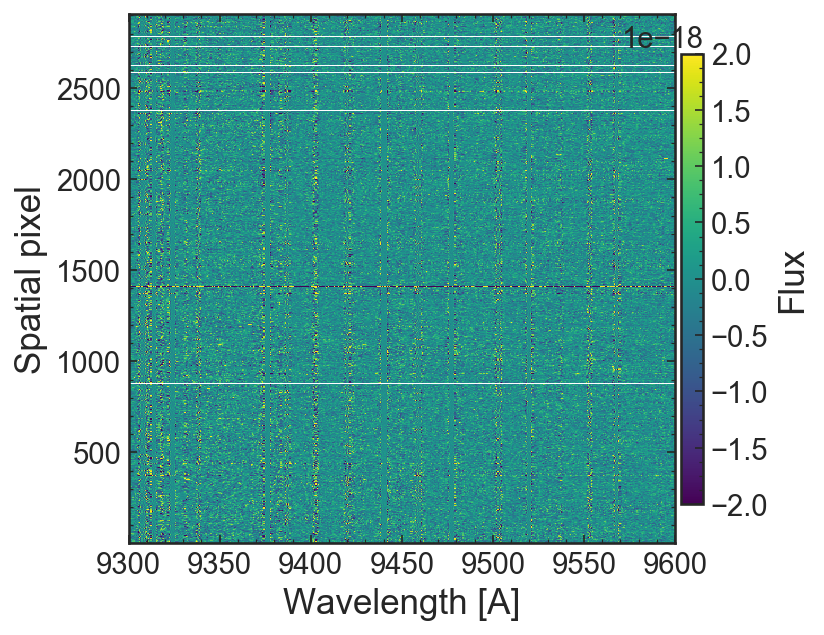

In [115]:
dat2D_clean, var_30 = clean_dat2D(dat2D_cut_rescale_nm, evals, espectra, N_espec=50)

pmin, pmax = 1, 99.
# vmin, vmax = -2.965e+00, 3.509865e+00
vmin, vmax = -2e-18, 2e-18
plot_slits2D(dat2D_cut_rescale_nm*std_rescale[:,None], vmin=vmin, vmax=vmax,
                     p_min=pmin, p_max=pmax, aspect=0.1,
                     extent=True, wmin=9300, wmax=9600, cmap='viridis')

plot_slits2D(dat2D_clean*std_rescale[:,None], vmin=vmin, vmax=vmax, aspect=0.1,
                     extent=True, wmin=9300, wmax=9600, cmap='viridis')

## Compare 2 wavelength ranges

9300 9500
Original dat2D shape (2907, 5632)
New dat2D shape (2907, 323)
Rescaled dat2D shape (2907, 323)
Initial number of nan pixels: 17202


/Users/cmason/opt/anaconda3/envs/astroconda/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


Final number of nan pixels: 0
-0.6264337551921576 0.5938277383203969
9400 9600
Original dat2D shape (2907, 5632)
New dat2D shape (2907, 322)
Rescaled dat2D shape (2907, 322)
Initial number of nan pixels: 15813
Final number of nan pixels: 0


/Users/cmason/opt/anaconda3/envs/astroconda/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


-0.7101786300704612 0.7694817695086074


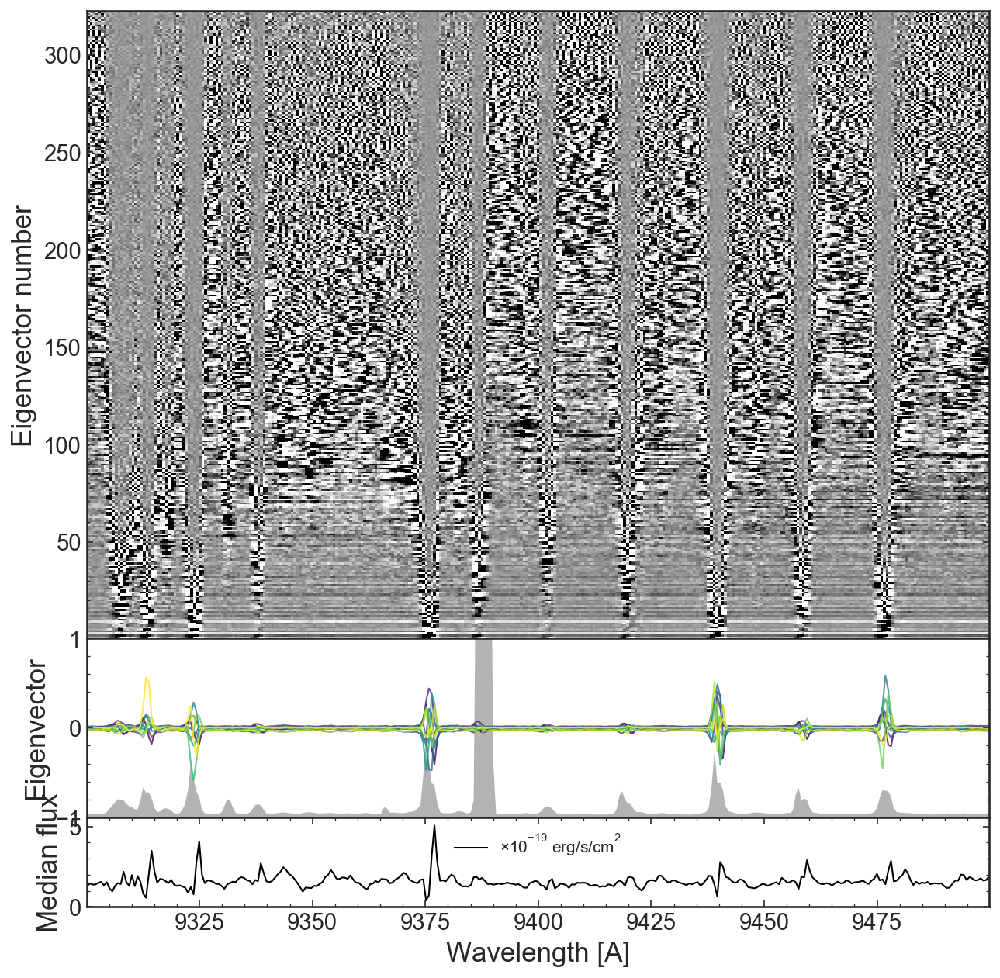

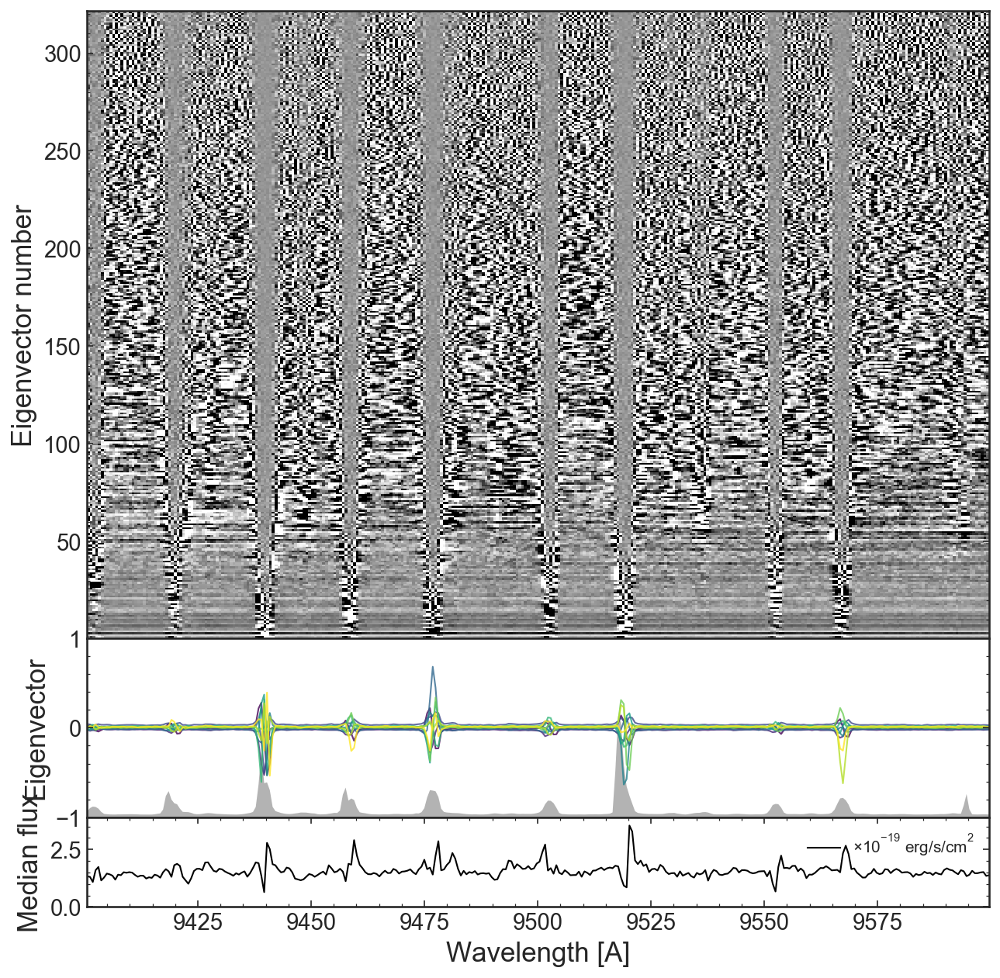

In [29]:
Wmin = [9300, 9400]
Wmax = [9500, 9600]

for wmin, wmax in zip(Wmin, Wmax):
    print(wmin, wmax)
    dat2D_cut_rescale_nm, wave_cut_i = get_dat2D_section(dat2D_all, wavemin=wmin, wavemax=wmax, 
                                                         plot=False, aspect=0.05)
    espectra, evals = _isvd(dat2D_cut_rescale_nm)
    plot_espectra(espectra, wave_cut_i, med_spec1D, N_espec=10)

## Whole wavelength range

Original dat2D shape (2907, 5632)
New dat2D shape (2907, 5083)


/Users/cmason/opt/anaconda3/envs/astroconda/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


Rescaled dat2D shape (2907, 5083)
Initial number of nan pixels: 3194031


/Users/cmason/opt/anaconda3/envs/astroconda/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:995: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)


Final number of nan pixels: 0
vmin: -8.357e-01,  vmax:1.323529e+00


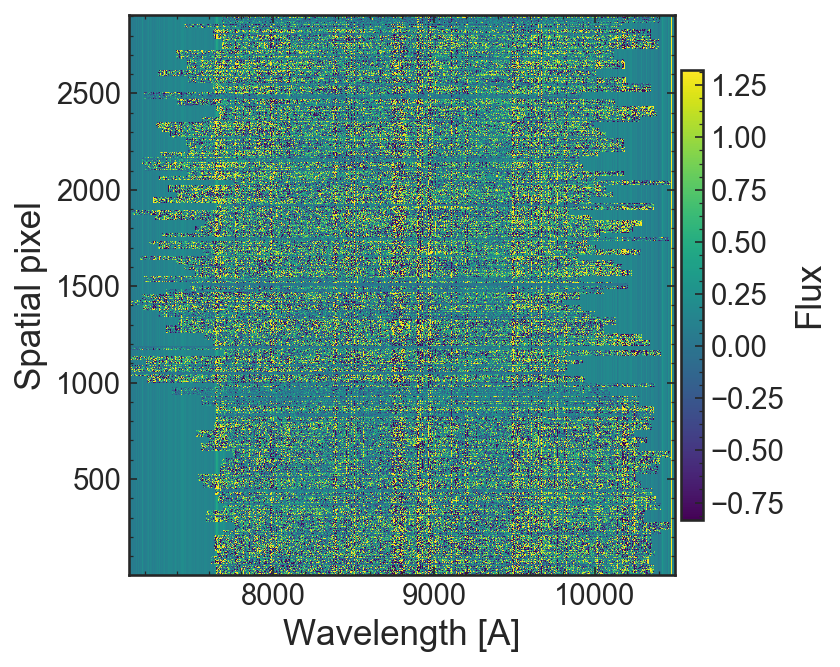

In [30]:
dat2D_cut_rescale_nm_big, wave_cut_i_big = get_dat2D_section(dat2D_all, wavemin=7100., wavemax=10500., aspect=1.2)

### Do SVD

In [31]:
espectra_big, evals_big = _isvd(dat2D_cut_rescale_nm_big)
print(espectra_big.shape, evals_big.shape)

(5083, 5083) (5083, 2907)


-0.6740391699659307 0.99967950121535


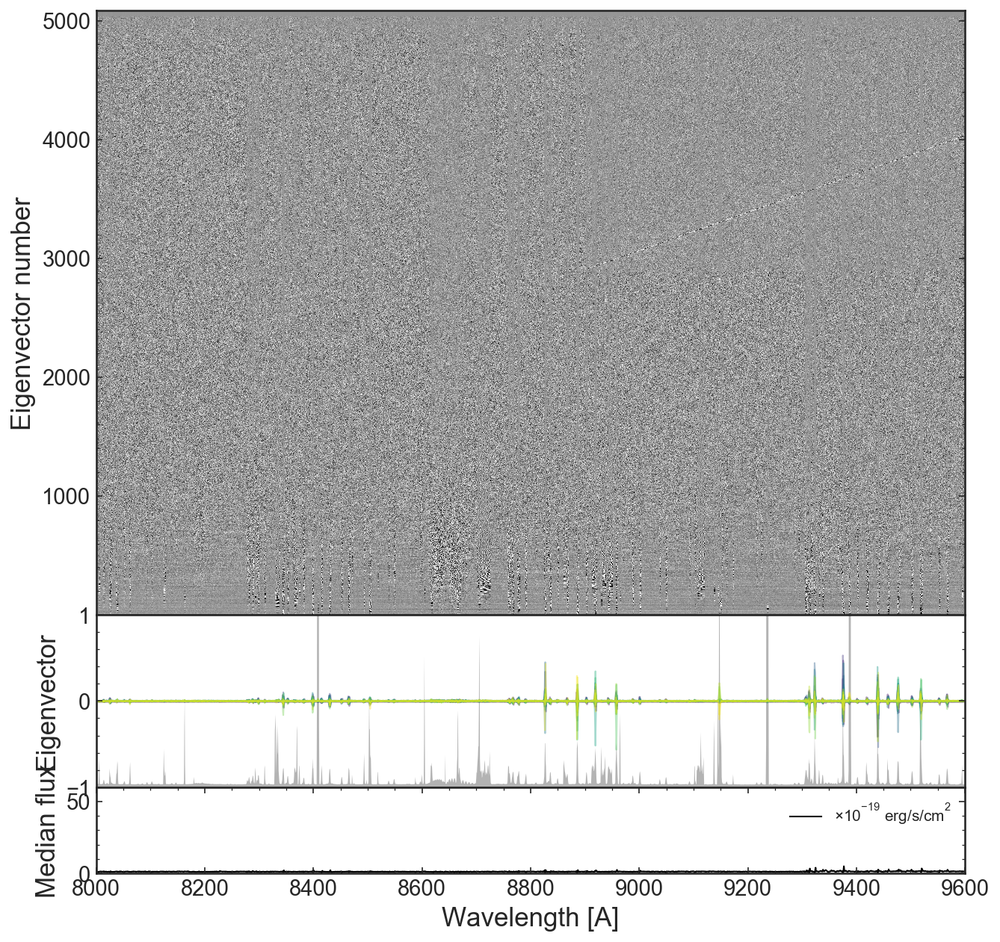

In [32]:
plot_espectra(espectra_big, wave_cut_i_big, med_spec1D, wavemin=8000, wavemax=9600)

### Clean spectrum

In [33]:
# Clean
dat2D_clean_big, var_big = clean_dat2D(dat2D_cut_rescale_nm_big, evals_big, espectra_big, N_espec=10)

vmin: -5.266e+00,  vmax:6.654428e+00
vmin: -4.912e+00,  vmax:5.289828e+00


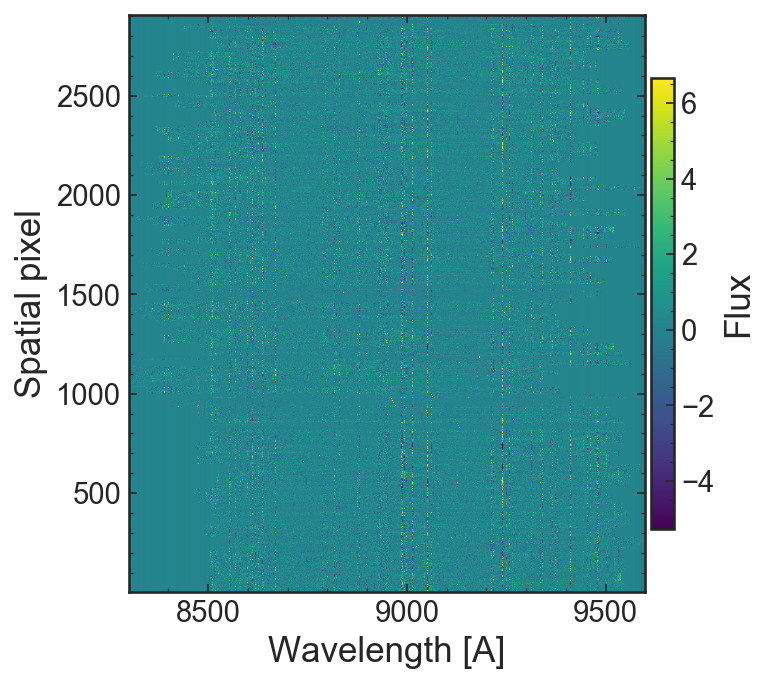

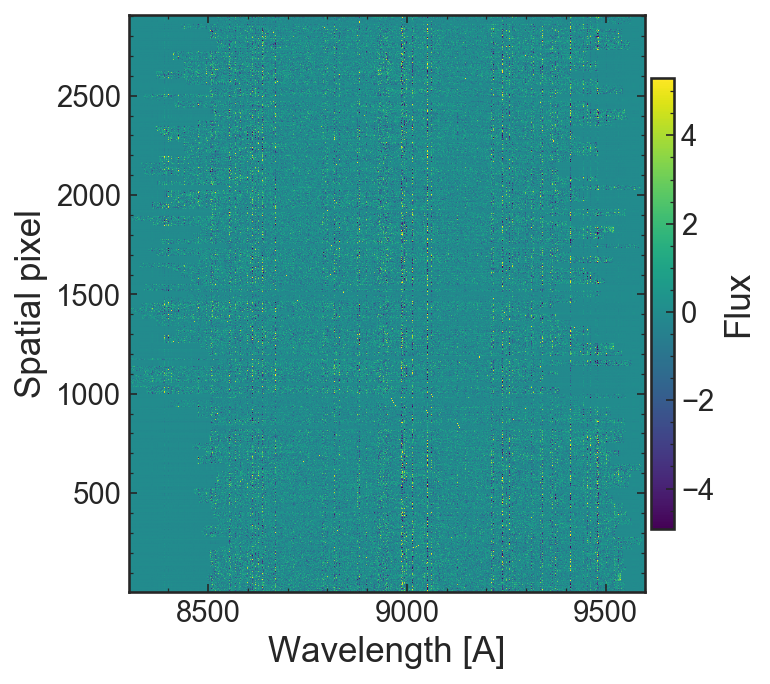

In [34]:
pmin, pmax = 0.1, 99.9
plot_slits2D(dat2D_cut_rescale_nm_big, p_min=pmin, p_max=pmax, aspect=0.5,
                     extent=True, wmin=8300, wmax=9600, cmap='viridis')

plot_slits2D(dat2D_clean_big, p_min=pmin, p_max=pmax, aspect=0.5,
                     extent=True, wmin=8300, wmax=9600, cmap='viridis')

### Contribution of eigen spectra to variance in whole frame

In [ ]:
dat2D_clean_big_all, var_big_all = clean_dat2D(dat2D_cut_rescale_nm_big, evals_big, espectra_big, N_espec=500)

In [ ]:
fig, ax = plt.subplots(3,1, figsize=(6,6), sharex=True)

ax[0].semilogx(np.arange(N_espec), var_big_all, lw=1)
ax[1].plot(np.arange(N_espec), np.gradient(var_big_all), lw=1)
ax[2].semilogy(np.arange(N_espec), np.gradient(np.gradient(var_big_all)), lw=1)

for axi in ax:
    axi.axhline(1e-3, lw=0.5, ls='dashed', c='0.5')

plt.xlabel('Number of eigenspectra')
ax[0].set_ylabel('Var')
ax[1].set_ylabel('dVar/dN')
ax[2].set_ylabel('d$^2$Var/dN$^2$')

fig.subplots_adjust(hspace=0)

# Check high priority slits

In [78]:
slit_LAE = slits[(slits.priority == 1.) & (slits.type == 'TARGET')].reset_index()


 845492 nans
vmin: -1.713e-18,  vmax:2.070939e-18


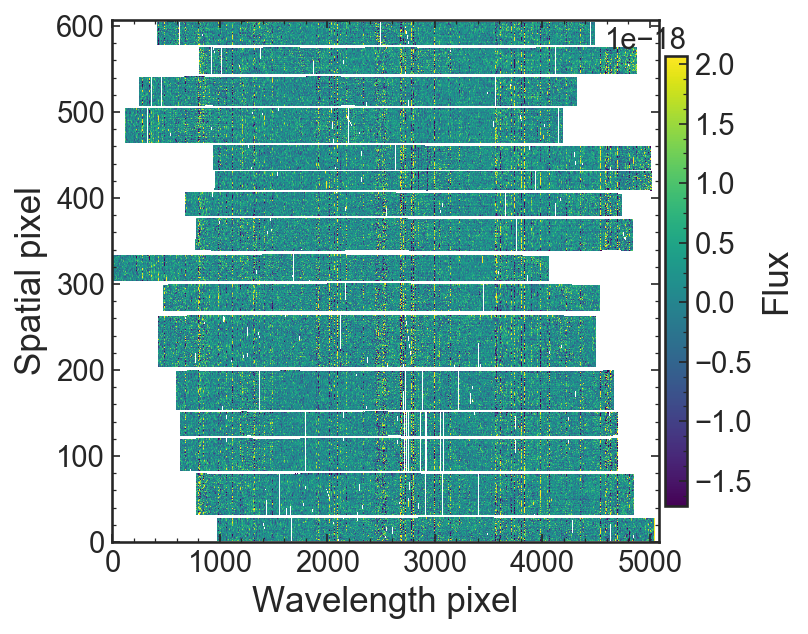

In [88]:
dat2D_all_LAE = get_highz_slits2D(frame_file, slit_LAE, edge_pix=1)[:,wave_cut_i_big]
print('\n',np.count_nonzero(np.isnan(dat2D_all_LAE)),'nans')
p_min, p_max = 1, 99
plot_slits2D(dat2D_all_LAE, p_min, p_max, dpi=150, aspect=8)

In [104]:
dat2D_all_LAE[np.isnan(dat2D_all_LAE)] = np.nanmedian(dat2D_all_LAE)
evals_LAE = dat2D_all_LAE.dot(espectra_big).T
print(evals_LAE.shape)


(5083, 608)


In [105]:
dat2D_clean_LAE_all, var_LAE_all = clean_dat2D(dat2D_all_LAE, evals_LAE, espectra_big, N_espec=30)

vmin: -2.854e-18,  vmax:1.690432e-18


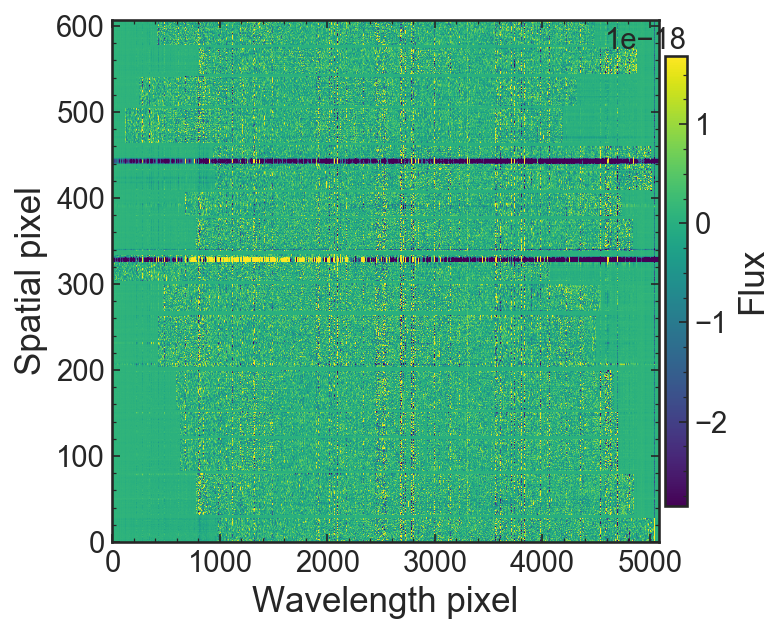

In [106]:
# plt.imshow(dat2D_clean_LAE_all)
p_min, p_max = 1, 99


plot_slits2D(dat2D_clean_LAE_all, p_min, p_max, dpi=150, aspect=8)